<a href="https://colab.research.google.com/github/HarshChandravanshi/road_safety_dataset/blob/main/road_safety_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from sklearn.datasets import fetch_openml
import pandas as pd
import matplotlib.pyplot as plt


dataset = fetch_openml(data_id=42803, as_frame=True)
df_x = dataset["frame"]

print(df_x.shape)

pd.value_counts(df_x.dtypes)



(363243, 67)


float64    61
object      6
dtype: int64

In [ ]:
print(df_x)

       Accident_Index  Vehicle_Reference_df_res  Vehicle_Type  \
0       201501BS70001                       1.0          19.0   
1       201501BS70002                       1.0           9.0   
2       201501BS70004                       1.0           9.0   
3       201501BS70005                       1.0           9.0   
4       201501BS70008                       1.0           1.0   
...               ...                       ...           ...   
363238  2015984141415                      13.0           9.0   
363239  2015984141415                      13.0           9.0   
363240  2015984141415                      13.0           9.0   
363241  2015984141415                      13.0           9.0   
363242  2015984141415                      13.0           9.0   

        Towing_and_Articulation  Vehicle_Manoeuvre  \
0                           0.0                9.0   
1                           0.0                9.0   
2                           0.0                9.0   
3  

In [ ]:
# Display non-numerical features
df_x.select_dtypes(exclude="number").head()

,Accident_Index,Sex_of_Driver,Date,Time,Local_Authority_(Highway),LSOA_of_Accident_Location
0,201501BS70001,1.0,12/01/2015,18:45,E09000020,E01002825
1,201501BS70002,1.0,12/01/2015,07:50,E09000020,E01002820
2,201501BS70004,1.0,12/01/2015,18:08,E09000020,E01002833
3,201501BS70005,1.0,13/01/2015,07:40,E09000020,E01002874
4,201501BS70008,1.0,09/01/2015,07:30,E09000020,E01002814


In [ ]:
# Changes data type of 'Sex_of_Driver' because it was stored as non-non-numerical
df_x["Sex_of_Driver"] = df_x["Sex_of_Driver"].astype("float")
df_x.describe(exclude="number")

,Accident_Index,Date,Time,Local_Authority_(Highway),LSOA_of_Accident_Location
count,363243,319866,319822,319866,298758
unique,140056,365,1439,204,25979
top,201543P296025,14/02/2015,17:30,E10000017,E01028497
freq,1332,2144,2972,8457,1456


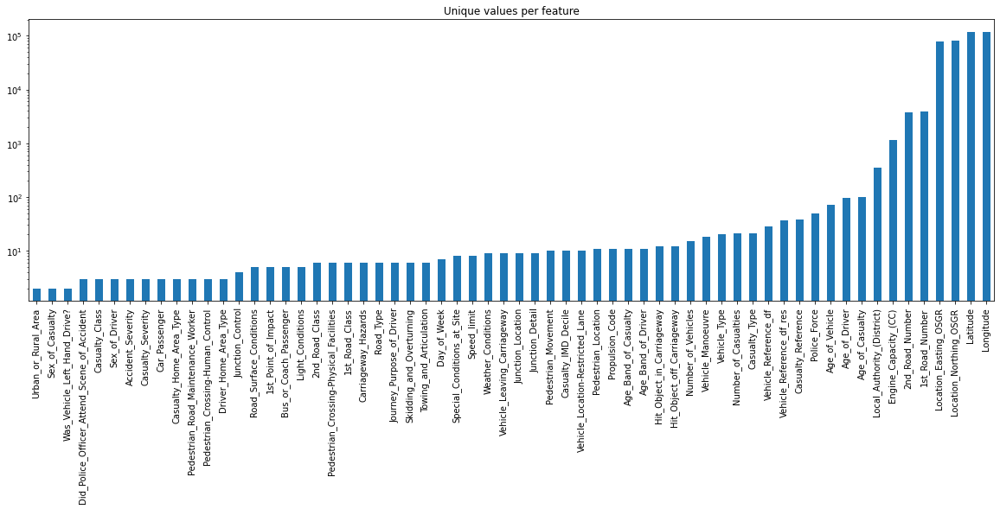

In [ ]:
unique_values = df_x.select_dtypes(include="number").nunique().sort_values()
unique_values.plot.bar(logy=True, figsize=(20,6), title="Unique values per feature")

In [ ]:
n_duplicates = df_x.drop(labels=["Accident_Index"], axis=1).duplicated().sum()
print("Duplicates Value=",n_duplicates)
#Extracting column names of all features, except 'Accident_Index'
columns_to_consider = df_x.drop(labels=["Accident_Index"], axis=1).columns
# Droping duplicates based on 'columns_to_consider'
df_x = df_x.drop_duplicates(subset=columns_to_consider)
df_x.shape


Duplicates Value= 22


(363221, 67)

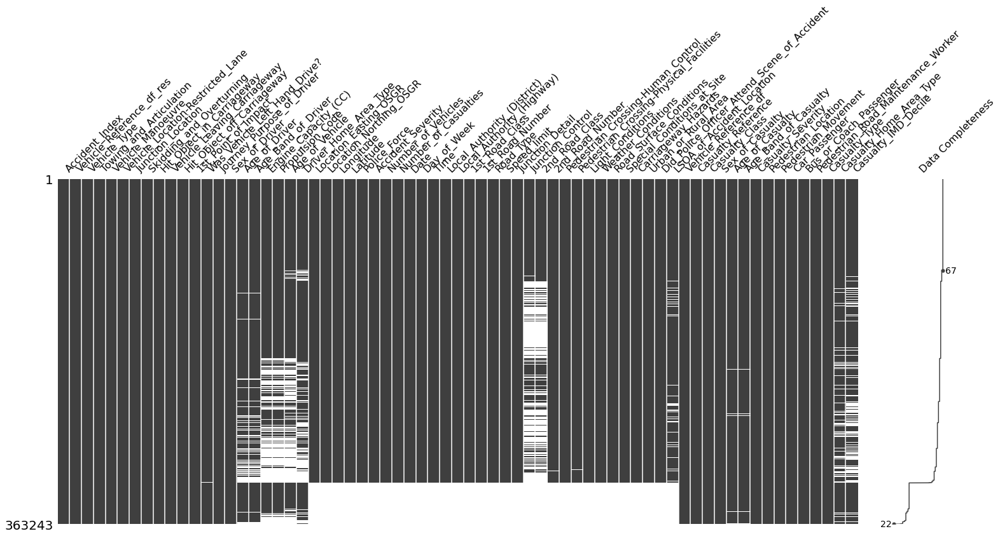

In [ ]:
import missingno as msno
#missing values per sample
msno.matrix(df_x, labels=True, sort="descending");

In [ ]:
#From above figure we can see that the dataset has a huge whole, caused by some samples where more than 50% of the feature values are missing. 
#For those samples, filling the missing values with some replacement values is probably not a good idea.
#Therefore, drop samples that have more than 20% of missing values.
df_x = df_x.dropna(thresh=df_x.shape[1] * 0.80, axis=0).reset_index(drop=True)
df_x.shape

(319795, 67)

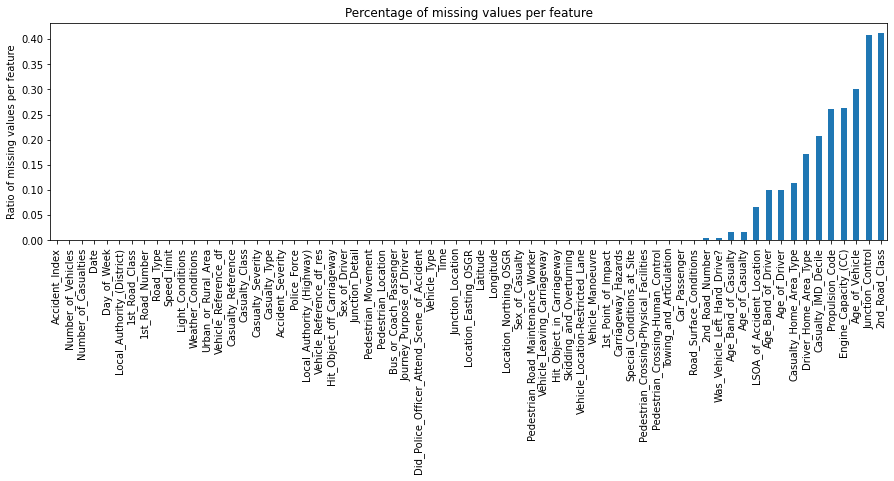

In [ ]:
df_x.isna().mean().sort_values().plot(
    kind="bar", figsize=(15, 4),
    title="Percentage of missing values per feature",
    ylabel="Ratio of missing values per feature");

In [ ]:
#From this figure we can see that most features don’t contain any missing values. 
#Nonetheless, features like 2nd_Road_Class, Junction_Control, Age_of_Vehicle still contain quite a lot of missing values
#So removing feature with more than 15% of missing values.
df_x = df_x.dropna(thresh=df_x.shape[0] * 0.85, axis=1)
df_x.shape

(319795, 60)

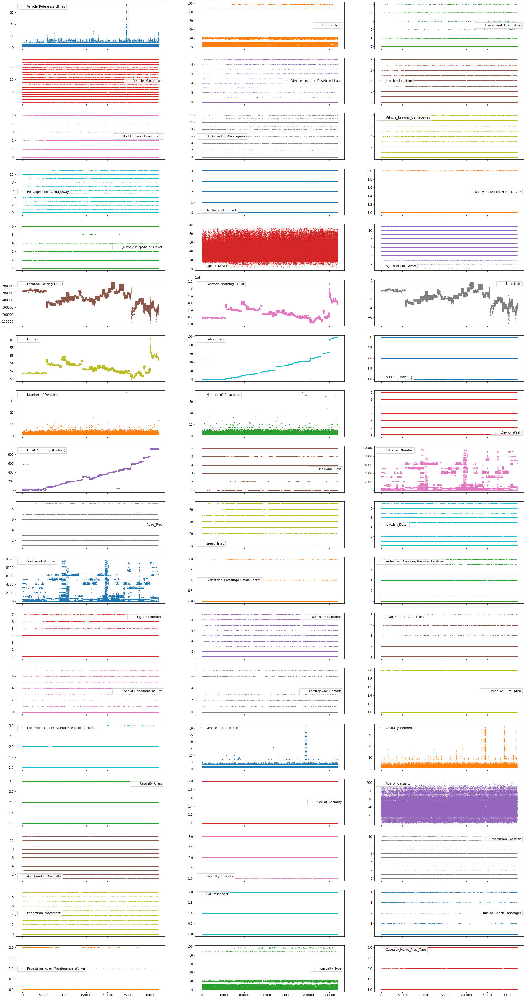

In [ ]:
df_x.plot(lw=0, marker=".", subplots=True, layout=(-1, 3),
          figsize=(30, 60), markersize=1);

In [ ]:
# Extracting descriptive properties of non-numerical features
df_x.describe(exclude=["number", "datetime"])

,Accident_Index,Sex_of_Driver,Date,Time,Local_Authority_(Highway),LSOA_of_Accident_Location
count,319795,319795,319795,319751,319795,298698
unique,123646,3,365,1439,204,25977
top,201543P296025,1.0,14/02/2015,17:30,E10000017,E01028497
freq,1332,211220,2144,2969,8457,1456


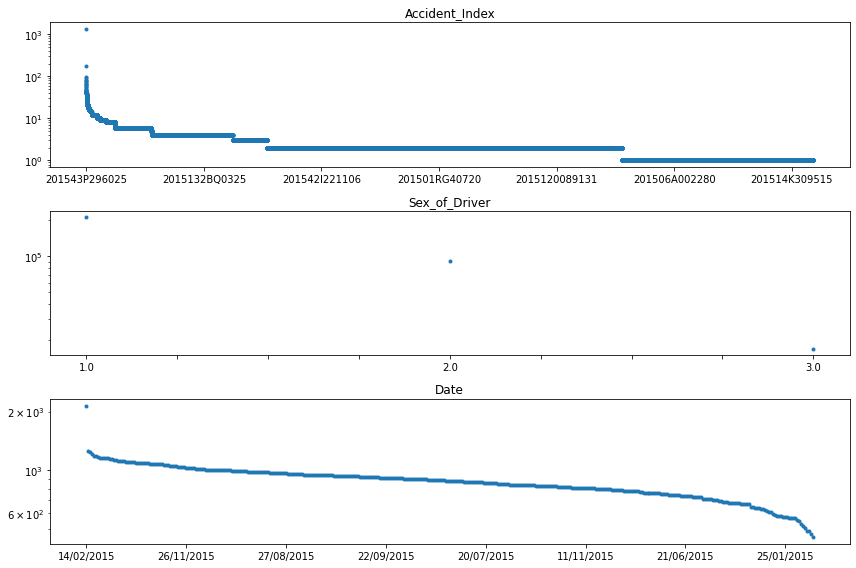

In [ ]:
# Create figure object with 3 subplots
fig, axes = plt.subplots(ncols=1, nrows=3, figsize=(12, 8))

# Identify non-numerical features
df_non_numerical = df_x.select_dtypes(exclude=["number", "datetime"])

# Loop through features and put each subplot on a matplotlib axis object
for col, ax in zip(df_non_numerical.columns, axes.ravel()):

    # Selects one single feature and counts number of occurrences per unique value
    df_non_numerical[col].value_counts().plot(

        # Plots this information in a figure with log-scaled y-axis
        logy=True, title=col, lw=0, marker=".", ax=ax)
    
plt.tight_layout();

We can see that the most frequent accident i.e. Accident_Index, had more than 100 people involved. Digging a bit deeper i.e. looking at the individual features of this accident, we could identify that this accident happened on February 24th, 2015 at 11:55 in Cardiff UK. 

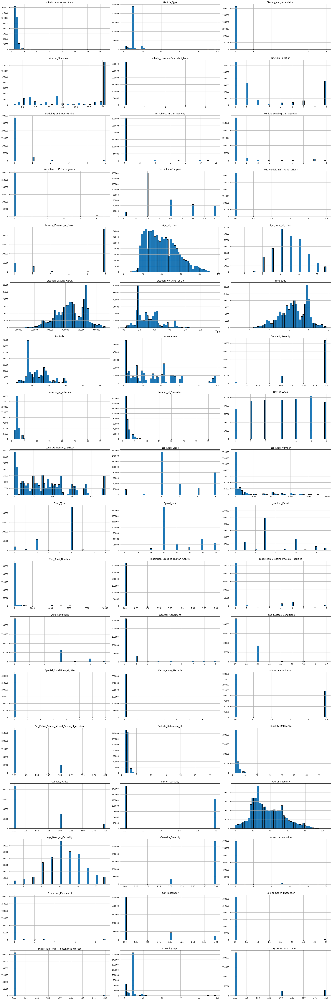

In [ ]:
# Plots the histogram for each numerical feature in a separate subplot
df_x.hist(bins=50, figsize=(25, 75), layout=(-1, 3), edgecolor="black")
plt.tight_layout()

Pedestrian_Crossing-Human_Control     0.995291
Was_Vehicle_Left_Hand_Drive?          0.990103
Towing_and_Articulation               0.982823
Vehicle_Location-Restricted_Lane      0.982207
Pedestrian_Road_Maintenance_Worker    0.981322
dtype: float64

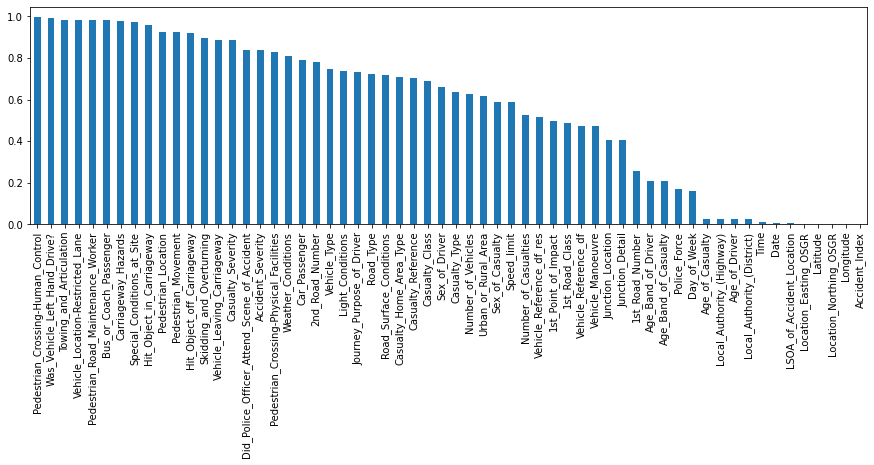

In [ ]:
# Collects for each feature the most frequent entry
most_frequent_entry = df_x.mode()

# Checks for each entry if it contains the most frequent entry
df_freq = df_x.eq(most_frequent_entry.values, axis=1)

# Computes the mean of the 'is_most_frequent' occurrence
df_freq = df_freq.mean().sort_values(ascending=False)

# Show the 5 top features with the highest ratio of singular value content
display(df_freq.head())

# Visualize the 'df_freq' table
df_freq.plot.bar(figsize=(15, 4));

In [ ]:
# Creates mask to identify numerical features with more or less than 25 unique features
cols_continuous = df_x.select_dtypes(include="number").nunique() >= 25
# Create a new dataframe which only contains the continuous features
df_continuous = df_x[cols_continuous[cols_continuous].index]
df_continuous.shape

(319795, 13)

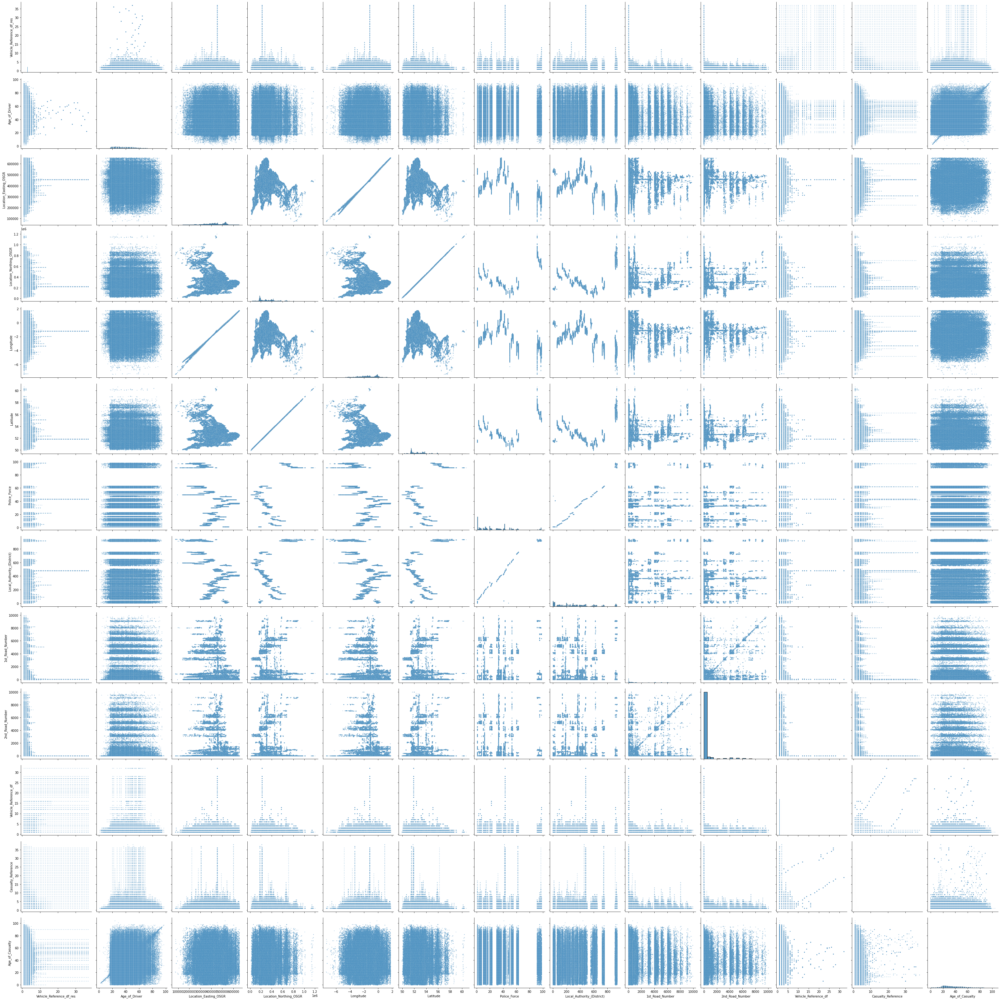

In [ ]:
import seaborn as sns
sns.pairplot(df_continuous, height=3.5, plot_kws={"s": 4, "alpha": 0.4});

Location_Easting_OSGR and Longitude, as well as Location_Easting_OSGR and Latitude seem to have a very strong linear relationship.

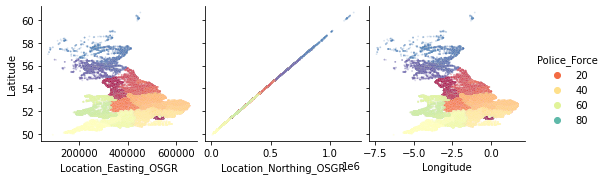

In [ ]:
sns.pairplot(
    df_x, plot_kws={"s": 3, "alpha": 0.2}, hue="Police_Force", palette="Spectral",
    x_vars=["Location_Easting_OSGR", "Location_Northing_OSGR", "Longitude"],
    y_vars="Latitude")

In [ ]:
# Create a new dataframe which doesn't contain the numerical continuous features
df_discrete = df_x[cols_continuous[~cols_continuous].index]
df_discrete.shape

(319795, 41)

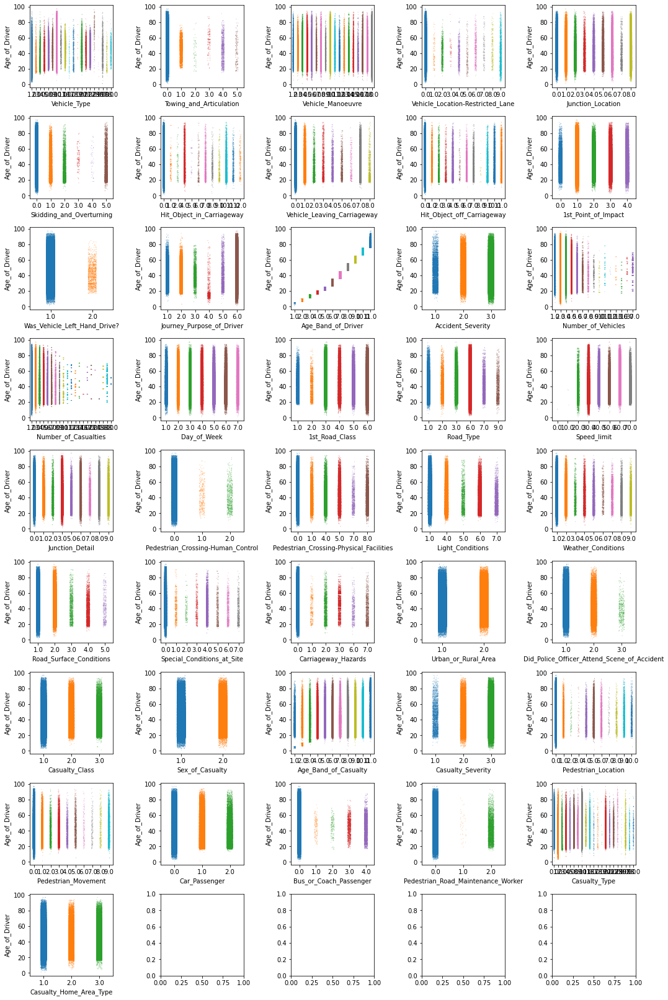

In [ ]:
import numpy as np

# Establishing number of columns and rows needed to plot all features
n_cols = 5
n_elements = len(df_discrete.columns)
n_rows = np.ceil(n_elements / n_cols).astype("int")

# Specify y_value to spread data (ideally a continuous feature)
y_value = df_x["Age_of_Driver"]

# Create figure object with as many rows and columns as needed
fig, axes = plt.subplots(ncols=n_cols, nrows=n_rows, figsize=(15, n_rows * 2.5))

# Loop through features and put each subplot on a matplotlib axis object
for col, ax in zip(df_discrete.columns, axes.ravel()):
    sns.stripplot(data=df_x, x=col, y=y_value, ax=ax, palette="tab10", size=1, alpha=0.5)
plt.tight_layout();

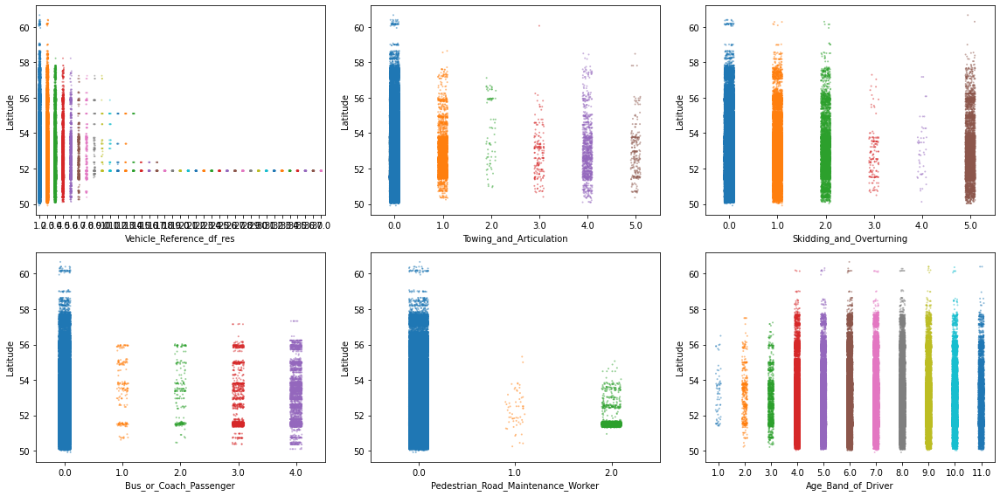

In [ ]:
# Specifing features of my interest
selected_features = ["Vehicle_Reference_df_res", "Towing_and_Articulation",
                     "Skidding_and_Overturning", "Bus_or_Coach_Passenger",
                     "Pedestrian_Road_Maintenance_Worker", "Age_Band_of_Driver"]

# Creating a figure with 3 x 2 subplots
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(16, 8))

# Loop through these features and plot entries from each feature against `Latitude`
for col, ax in zip(selected_features, axes.ravel()):
    sns.stripplot(data=df_x, x=col, y=df_x["Latitude"], ax=ax,
                  palette="tab10", size=2, alpha=0.5)
plt.tight_layout();

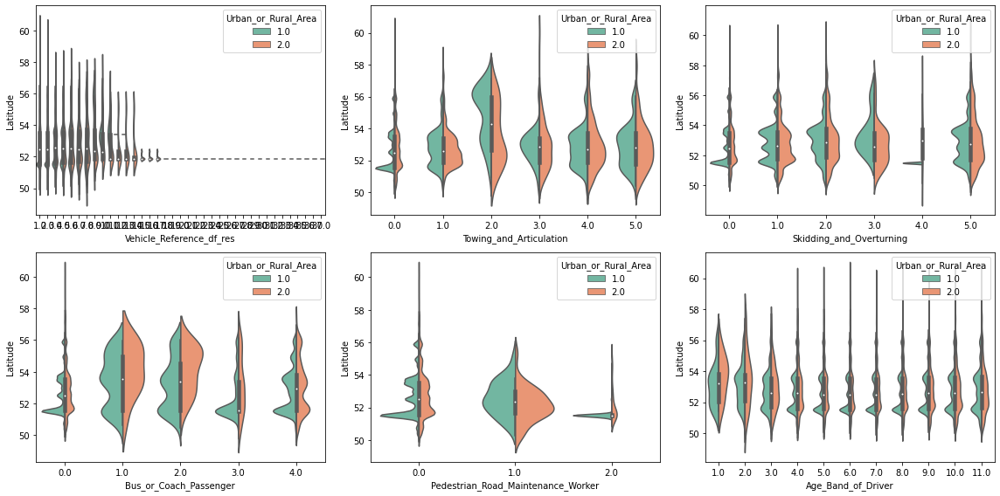

In [ ]:
#separating each visualization by Urban_or_Rural_Area
# Create a figure with 3 x 2 subplots
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(16, 8))

# Loop through these features and plot entries from each feature against `Latitude`
for col, ax in zip(selected_features, axes.ravel()):
    sns.violinplot(data=df_x, x=col, y=df_x["Latitude"], palette="Set2",
                   split=True, hue="Urban_or_Rural_Area", ax=ax)
plt.tight_layout();

 We can see that some values on features are more frequent in urban, than in rural areas and vice versa. Furthermore, as suspected, there seems to be a high density peak at latitude 51.5. This is very likely due to the more densely populated region around London (at 51.5074°).

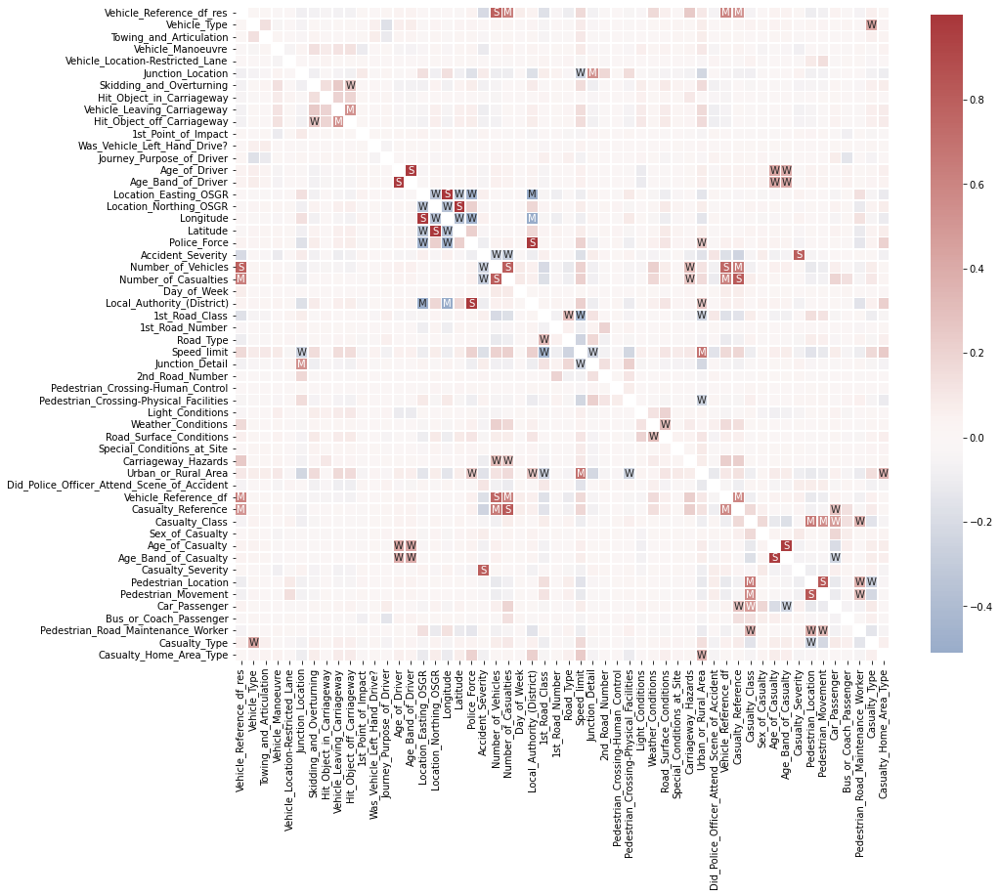

In [ ]:
# Computes feature correlation
df_corr = df_x.corr(method="pearson")
# Create labels for the correlation matrix
labels = np.where(np.abs(df_corr)>0.75, "S",
                  np.where(np.abs(df_corr)>0.5, "M",
                           np.where(np.abs(df_corr)>0.25, "W", "")))

# Plot correlation matrix
plt.figure(figsize=(15, 15))
sns.heatmap(df_corr, mask=np.eye(len(df_corr)), square=True,
            center=0, annot=labels, fmt='', linewidths=.5,
            cmap="vlag", cbar_kws={"shrink": 0.8});

In [ ]:
#ordering all of these different correlations
#  Creates a mask to remove the diagonal and the upper triangle.
lower_triangle_mask = np.tril(np.ones(df_corr.shape), k=-1).astype("bool")

#  Stack all correlations, after applying the mask
df_corr_stacked = df_corr.where(lower_triangle_mask).stack().sort_values()

#  Showing the lowest and highest correlations in the correlation matrix
display(df_corr_stacked)

Local_Authority_(District)  Longitude                -0.509769
                            Location_Easting_OSGR    -0.503326
Police_Force                Longitude                -0.471718
                            Location_Easting_OSGR    -0.461474
Speed_limit                 1st_Road_Class           -0.451950
                                                        ...   
Age_Band_of_Casualty        Age_of_Casualty           0.974459
Age_Band_of_Driver          Age_of_Driver             0.979036
Local_Authority_(District)  Police_Force              0.984576
Longitude                   Location_Easting_OSGR     0.999362
Latitude                    Location_Northing_OSGR    0.999974
Length: 1431, dtype: float64

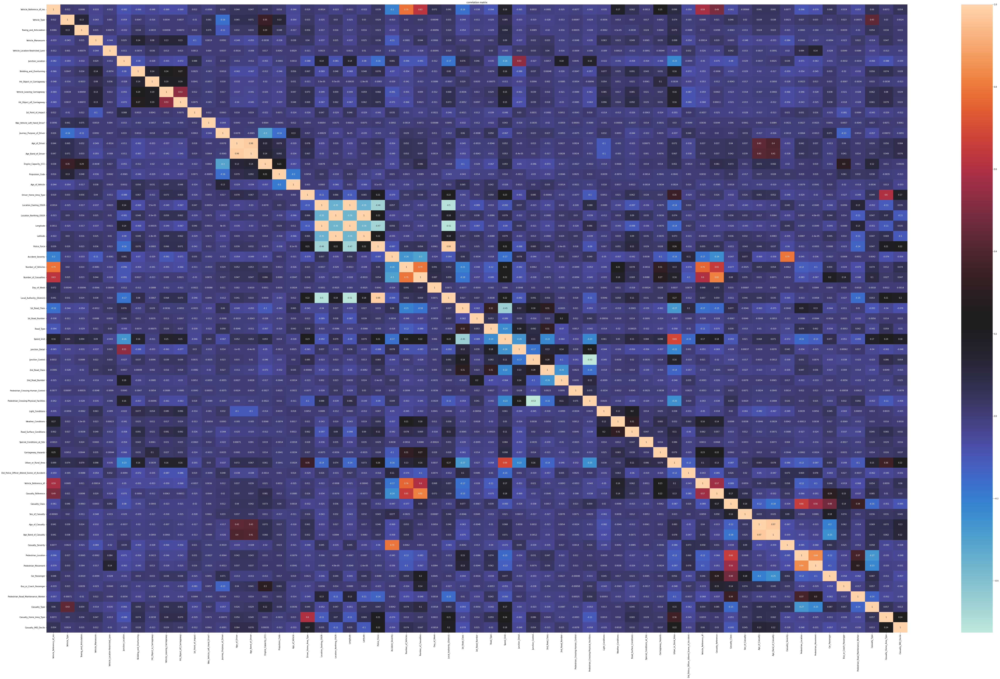

In [ ]:
plt.figure(figsize=(100,60))
sns.heatmap(df_x.corr(), annot=True, cmap='icefire').set_title('correlation matrix')
plt.show()